In [1]:
import math
import cv2
import numpy as np
import glob
import matplotlib.pyplot as plt
from scipy import ndimage as ndi
from skimage.segmentation import watershed
from skimage.feature import peak_local_max
from matplotlib.patches import Rectangle
import os

from mpl_toolkits import mplot3d

In [2]:
imgd0 = cv2.imread("./COMP9517 20T2 Group Project Image Sequences/DIC-C2DH-HeLa/Sequence 1/t000.tif", 0)
imgd1 = cv2.imread("./COMP9517 20T2 Group Project Image Sequences/DIC-C2DH-HeLa/Sequence 1/t001.tif", 0)
imgf0 = cv2.imread("./COMP9517 20T2 Group Project Image Sequences/Fluo-N2DL-HeLa/Sequence 1/t000.tif", 0)
imgf1 = cv2.imread("./COMP9517 20T2 Group Project Image Sequences/Fluo-N2DL-HeLa/Sequence 1/t001.tif", 0)
imgp0 = cv2.imread("./COMP9517 20T2 Group Project Image Sequences/PhC-C2DL-PSC/Sequence 1/t000.tif", 0)
imgp1 = cv2.imread("./COMP9517 20T2 Group Project Image Sequences/PhC-C2DL-PSC/Sequence 1/t001.tif", 0)

In [3]:
def preprocessing(i, image):
    image = cv2.fastNlMeansDenoising(image,50,50,7,21)
    sigma=15/(2*math.sqrt(2*np.log(2)))
    image = ndi.maximum_filter(image, size=15, mode='constant')
    image=image.astype(np.uint8)
    kernel = np.ones((3,3),np.uint8)
    image = cv2.erode(image,kernel,iterations = 1)
    ret,otsu = cv2.threshold(image,0,255, cv2.THRESH_OTSU)
    dst=cv2.Laplacian(otsu, -1, ksize=3)
    bilinear_img = cv2.resize(dst,None, fx = 20, fy = 20, interpolation = cv2.INTER_LINEAR)
    return otsu

In [4]:
def draw_contour(image, original):
    cells=[]
    cnts = cv2.findContours(image.copy(), cv2.RETR_CCOMP, cv2.CHAIN_APPROX_TC89_L1)

    ROIS = []
    for c in cnts[1]:
        (x, y, w, h) = cv2.boundingRect(c)
        ROIS.append([x, y, x+w, y+h])

    ROIS = np.array(ROIS)
    
    for i in range(len(ROIS[:, 0])):
        x1=ROIS[i, 0]
        x2=ROIS[i, 2]
        y1=ROIS[i, 1]
        y2=ROIS[i, 3]
        rect = Rectangle((x1, y1), (x2-x1), (y2-y1), fill=False, color='red')
        cropped=original[y1:y2, x1:x2]
        cropped=np.array(cropped)
        cells.append((i, cropped, x1, x2, y1, y2))
    return cells

In [5]:
# def draw_contour_without_label(image, original):
#     cells=[]
#     cnts = cv2.findContours(image.copy(), cv2.RETR_CCOMP, cv2.CHAIN_APPROX_TC89_L1)

#     ROIS = []
#     for c in cnts[1]:
#         (x, y, w, h) = cv2.boundingRect(c)
#         ROIS.append([x, y, x+w, y+h])

#     ROIS = np.array(ROIS)
    
#     for i in range(len(ROIS[:, 0])):
#         x1=ROIS[i, 0]
#         x2=ROIS[i, 2]
#         y1=ROIS[i, 1]
#         y2=ROIS[i, 3]
#         rect = Rectangle((x1, y1), (x2-x1), (y2-y1), fill=False, color='red')
#         cropped=original[y1:y2, x1:x2]
#         cropped=np.array(cropped)
#         cells.append((None, cropped, x1, x2, y1, y2))
#     return cells

In [6]:
def E_colour(cell_curr, cell_next):
    I_next=np.mean(cell_next)
    h, w=cell_curr.shape
    return math.sqrt(np.sum((cell_curr-I_next)**2)/(h*w))

In [7]:
def E_displacement(cell_curr_mid_x, cell_curr_mid_y, cell_next_mid_x, cell_next_mid_y):
    return math.sqrt((cell_next_mid_x-cell_curr_mid_x)**2+(cell_next_mid_y-cell_curr_mid_y)**2)

In [8]:
def E_skewness(cell_curr_x, cell_curr_y, cell_next_x, cell_next_y, cell_next_next_x, cell_next_next_y):
    tux=cell_curr_x-cell_next_x
    tuy=cell_curr_y-cell_next_y
    
    uvx=cell_next_x-cell_next_next_x
    uvy=cell_next_y-cell_next_next_y
    
    bottom=math.sqrt((tux**2+tuy**2))*math.sqrt((uvx**2+uvy**2))
    return (1-(tux*uvx+tuy*uvy)/bottom)/2

In [9]:
# def E_total(e_col, e_dis, e_skew):
#     return 0.33*e_col+0.33*e_dis+0.33*e_skew
def E_total(e_col, e_dis):
    return 0.5*e_col+0.5*e_dis

In [10]:
def draw_trajectory():
    global trajectory
    global time_series
    if time_series==0:
        return 
    fig = plt.figure()
    ax = plt.axes(projection='3d')
    for key in trajectory.keys():
        xline=[]
        yline=[]
        start=None
        end=None
        started=None
        i=0
        for tup in trajectory[key]:
            if tup!=(-1, -1):
                started=True
                xline.append(tup[0])
                yline.append(tup[1])
            else:
                if start==None:
                    start=1
                elif started==None:
                    start+=1
                elif end==None:
                    end=i
            i+=1
        if start==None:
            start=0
            
        if end==None:
            end=time_series
        
        zline = np.linspace(start=start, stop=end, num=end+1)
        if len(xline)!=len(zline):
            continue
        ax.plot3D(xline, yline, zline, 'gray')
    plt.show()

In [11]:
trajectory={}
time_series=0
def min_E(path, new_img, curr_cells, next_cells):
    global trajectory
    global time_series
    selected=[]
    totals=[]
    max_label=0
    e_info=[]
    new_next_cells=next_cells.copy()
    for n_cell_info in next_cells:
        n, n_cell, n_x1, n_x2, n_y1, n_y2=n_cell_info[0], n_cell_info[1], n_cell_info[2], n_cell_info[3], n_cell_info[4], n_cell_info[5]
        n_mid_x=(n_x2-n_x1)/2+n_x1
        n_mid_y=(n_y2-n_y1)/2+n_y1
        
        mini=100000
        new_label=-1
        index=-1
        
        for c_cell_info in curr_cells:
            c, c_cell, c_x1, c_x2, c_y1, c_y2=c_cell_info[0], c_cell_info[1], c_cell_info[2], c_cell_info[3], c_cell_info[4], c_cell_info[5]
            c_mid_x=(c_x2-c_x1)/2+c_x1
            c_mid_y=(c_y2-c_y1)/2+c_y1
            if c_mid_x > n_mid_x+100 or c_mid_x < n_mid_x-100:
                continue
            if c_mid_y > n_mid_y+100 or c_mid_y < n_mid_y-100:
                continue   
            e_colour=E_colour(n_cell, c_cell)
            e_dis=E_displacement(c_mid_x, c_mid_y, n_mid_x, n_mid_y)
            e_total=E_total(e_colour, e_dis)
            
            e_info.append((n, c, e_total))
       
    e_info = sorted(e_info, key=lambda tup: tup[2])
    selected_n=[]
    selected_c=[]
    for info in e_info:
        n=info[0]
        if n in selected_n:
            continue
        c=info[1]
        if c in selected_c:
            continue
        temp=list(new_next_cells[n])
        temp[0]=c
        new_next_cells[n]=tuple(temp)
        
        x1, x2, y1, y2=new_next_cells[n][2], new_next_cells[n][3], new_next_cells[n][4], new_next_cells[n][5]
        mid_x=(x2-x1)/2+x1
        mid_y=(y2-y1)/2+y1
        if c not in trajectory.keys():
            trajectory[c]=[(-1, -1)]*time_series
        trajectory[c].append((mid_x, mid_y))
        
        selected_n.append(n)
        selected_c.append(c)
        if c > max_label:
            max_label=c
    
    for n in range(len(next_cells)):
        if n not in selected_n:
            max_label+=1
            temp=list(new_next_cells[n])
            temp[0]=max_label
            new_next_cells[n]=tuple(temp)
            x1, x2, y1, y2=new_next_cells[n][2], new_next_cells[n][3], new_next_cells[n][4], new_next_cells[n][5]
            mid_x=(x2-x1)/2+x1
            mid_y=(y2-y1)/2+y1
            
            if max_label not in trajectory.keys():
                trajectory[max_label]=[(-1, -1)]*time_series
            trajectory[max_label].append((mid_x, mid_y))
            
    for i in range(len(new_next_cells)):
        label, cells, x1, x2, y1, y2=new_next_cells[i]
        plt.title("Number of Cells: "+str(len(new_next_cells)))
        plt.imshow(new_img)
        rect = Rectangle((x1, y1), (x2-x1), (y2-y1), fill=False, color='red')
        plt.axes().add_patch(rect) 
        plt.text(x1+1,y1+1, str(label))
    plt.show()  
    draw_trajectory()
    time_series+=1
    return new_next_cells


/Users/shizukahayashi/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  


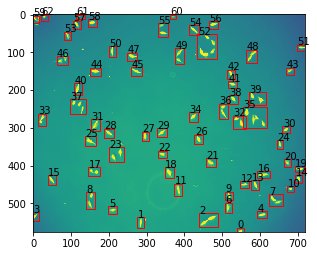

/Users/shizukahayashi/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:79: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


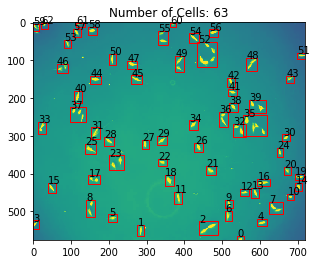

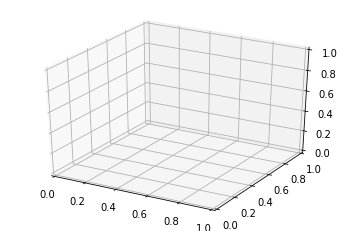

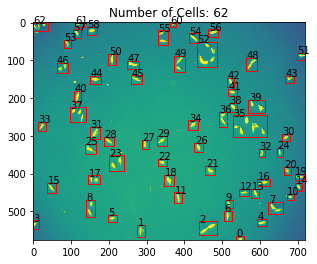

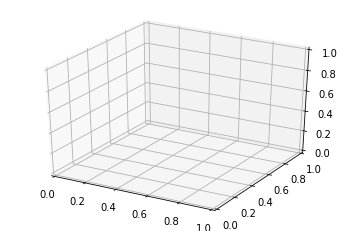

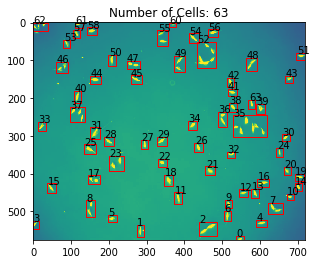

...

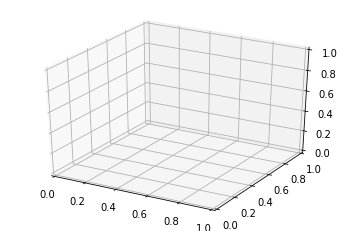

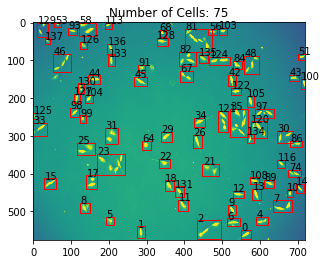

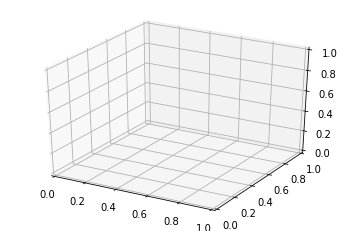

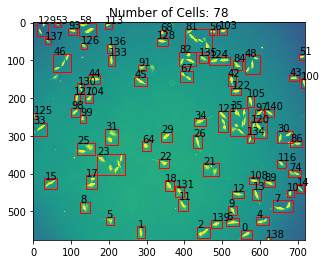

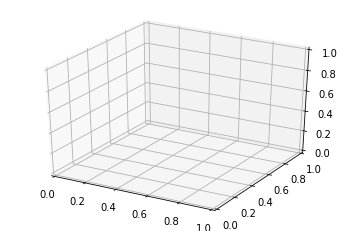

KeyboardInterrupt: 

In [16]:
curr=None
curr_cells=None
for path in sorted(os.listdir("./COMP9517 20T2 Group Project Image Sequences/PhC-C2DL-PSC/Sequence 1/")):
    img=cv2.imread("./COMP9517 20T2 Group Project Image Sequences/PhC-C2DL-PSC/Sequence 1/" + path, 0)
    if isinstance(curr, type(None)):
        curr=img
        img_pros=preprocessing(0, img)
        curr_cells=draw_contour(img_pros, img.copy())
        for i in range(len(curr_cells)):
            _, cells, x1, x2, y1, y2=curr_cells[i]
            plt.imshow(img)
            rect = Rectangle((x1, y1), (x2-x1), (y2-y1), fill=False, color='red')
            plt.axes().add_patch(rect) 
            plt.text(x1+1,y1+1, str(i))
        plt.show()
        continue
    curr=img
    img_pros=preprocessing(0, curr)
    next_cells=draw_contour(img_pros, curr.copy())
    curr_cells=min_E(path, curr, curr_cells, next_cells)

In [ ]:
# imgp0 = cv2.imread("./COMP9517 20T2 Group Project Image Sequences/PhC-C2DL-PSC/Sequence 1/t000.tif", 0)
# imgp1 = cv2.imread("./COMP9517 20T2 Group Project Image Sequences/PhC-C2DL-PSC/Sequence 1/t001.tif", 0)
# tracking(imgp0, imgp1)

In [13]:
trajectory.keys()

dict_keys([23, 8, 35, 11, 17, 31, 18, 22, 37, 29, 27, 5, 32, 26, 28, 21, 34, 6, 2, 25, 1, 60, 49, 39, 9, 46, 20, 36, 15, 52, 33, 55, 45, 38, 41, 12, 13, 48, 24, 53, 42, 54, 40, 43, 47, 0, 30, 7, 44, 16, 10, 57, 50, 4, 56, 61, 14, 19, 58, 59, 3, 51, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219,